# Project 2: Breakout Strategy
## Instructions
Each problem consists of a function to implement and instructions on how to implement the function.  The parts of the function that need to be implemented are marked with a `# TODO` comment. After implementing the function, run the cell to test it against the unit tests we've provided. For each problem, we provide one or more unit tests from our `project_tests` package. These unit tests won't tell you if your answer is correct, but will warn you of any major errors. Your code will be checked for the correct solution when you submit it to Udacity.

## Packages
When you implement the functions, you'll only need to you use the packages you've used in the classroom, like [Pandas](https://pandas.pydata.org/) and [Numpy](http://www.numpy.org/). These packages will be imported for you. We recommend you don't add any import statements, otherwise the grader might not be able to run your code.

The other packages that we're importing are `helper`, `project_helper`, and `project_tests`. These are custom packages built to help you solve the problems.  The `helper` and `project_helper` module contains utility functions and graph functions. The `project_tests` contains the unit tests for all the problems.

### Install Packages

In [1]:
import sys
!{sys.executable} -m pip install -r requirements.txt

    100% |████████████████████████████████| 880kB 5.8MB/s ta 0:00:01
    100% |████████████████████████████████| 17.0MB 2.2MB/s eta 0:00:01  8% |██▋                             | 1.4MB 13.3MB/s eta 0:00:02    13% |████▎                           | 2.2MB 25.6MB/s eta 0:00:01    26% |████████▋                       | 4.6MB 31.7MB/s eta 0:00:01    35% |███████████▌                    | 6.1MB 33.9MB/s eta 0:00:01    73% |███████████████████████▋        | 12.5MB 32.0MB/s eta 0:00:01
    100% |████████████████████████████████| 26.2MB 1.6MB/s eta 0:00:01  2% |▊                               | 552kB 28.7MB/s eta 0:00:01    31% |██████████                      | 8.3MB 28.9MB/s eta 0:00:01    75% |████████████████████████▏       | 19.8MB 26.7MB/s eta 0:00:01    90% |█████████████████████████████   | 23.8MB 25.8MB/s eta 0:00:01    98% |███████████████████████████████▋| 25.9MB 27.9MB/s eta 0:00:01
    100% |████████████████████████████████| 1.1MB 18.3MB/s ta 0:00:01    26% |████████▌              

### Load Packages

In [2]:
import pandas as pd
import numpy as np
import helper
import project_helper
import project_tests
%config InlineBackend.figure_format = 'retina'

## Market Data
### Load Data
While using real data will give you hands on experience, it's doesn't cover all the topics we try to condense in one project. We'll solve this by creating new stocks. We've create a scenario where companies mining [Terbium](https://en.wikipedia.org/wiki/Terbium) are making huge profits. All the companies in this sector of the market are made up. They represent a sector with large growth that will be used for demonstration latter in this project.

In [3]:
df_original = pd.read_csv('../../data/project_2/eod-quotemedia.csv', parse_dates=['date'], index_col=False)

# Add TB sector to the market
df = df_original
df = pd.concat([df] + project_helper.generate_tb_sector(df[df['ticker'] == 'AAPL']['date']), ignore_index=True)

close = df.reset_index().pivot(index='date', columns='ticker', values='adj_close')
high = df.reset_index().pivot(index='date', columns='ticker', values='adj_high')
low = df.reset_index().pivot(index='date', columns='ticker', values='adj_low')

print('Loaded Data')

Loaded Data


### View Data
To see what one of these 2-d matrices looks like, let's take a look at the closing prices matrix.

In [4]:
# first 5 observations in the close dataframe
close.head()

ticker,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,
2013-07-01,29.99418563,16.17609308,81.13821681,53.10917319,34.92447839,50.86319750,31.42538772,64.69409505,46.23500000,39.91336014,...,27.66879066,35.28892781,76.32080247,40.02387348,22.10666494,25.75338607,45.48038323,71.89882693,27.85858718,29.44789315
2013-07-02,29.65013670,15.81983388,80.72207258,54.31224742,35.42807578,50.69676639,31.27288084,64.71204071,46.03000000,39.86057632,...,27.54228410,35.05903252,76.60816761,39.96552964,22.08273998,25.61367511,45.40266113,72.93417195,28.03893238,28.57244125
2013-07-03,29.70518453,16.12794994,81.23729877,54.61204262,35.44486235,50.93716689,30.72565028,65.21451912,46.42000000,40.18607651,...,27.33445191,35.28008569,76.65042719,40.00442554,22.20236479,25.73475794,46.06329899,72.30145844,28.18131017,28.16838652
2013-07-05,30.43456826,16.21460758,81.82188233,54.17338125,35.85613355,51.37173702,31.32670680,66.07591068,47.00000000,40.65233352,...,27.69589920,35.80177117,77.39419581,40.67537968,22.58516418,26.06075017,46.41304845,73.16424628,29.39626730,29.02459772
2013-07-08,30.52402098,16.31089385,82.95141667,53.86579916,36.66188936,52.03746147,31.76628544,66.82065546,46.62500000,40.25645492,...,27.98505704,35.20050655,77.96892611,40.64620776,22.48946433,26.22840332,46.95062632,73.89282298,29.57661249,29.76536472


In [5]:
# last 5 observations in the close dataframe
close.tail()

ticker,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,
2017-06-26,58.57854478,48.36234805,121.52159207,143.57270901,70.35520945,94.31043377,47.95227368,120.09101209,144.96000000,78.92677572,...,42.76892496,65.99587865,78.12543603,63.56673975,27.95461459,54.05749897,73.49934641,127.97264293,41.75554533,62.43009343
2017-06-27,58.22256443,48.08474540,121.69121741,141.51491885,70.01668424,93.85848253,47.71697322,119.94376955,142.54000000,76.54633554,...,43.14151074,63.78164638,78.00041995,63.92391201,27.75350225,53.87954816,72.74212810,127.16946735,41.95278457,62.46990854
2017-06-28,58.73675827,48.82832394,116.45278767,143.58255490,70.52930812,94.69360982,47.53069368,121.46527575,143.81000000,77.58471685,...,43.30819385,64.67321778,78.40431807,64.82428373,28.28980181,54.34419748,72.91914017,127.42727680,42.37684891,62.65903032
2017-06-29,58.27398382,49.19515602,115.79424221,141.46568942,70.10373358,94.08445815,47.77579833,120.72906307,141.24000000,76.15449354,...,43.27877918,62.88027749,77.60613845,64.10898129,28.12560699,54.27499439,72.23075989,126.81250043,43.38276899,62.21111032
2017-06-30,58.77942143,49.88916265,116.33305213,141.80044954,70.13275003,92.87597984,47.65814810,121.40637874,141.44000000,76.21326984,...,42.94541296,63.01744232,77.63498832,64.41695873,27.74892476,54.79896064,72.53561401,127.31820357,43.30387330,62.09166499


In [6]:
# dimension of the close dataframe 
# the dimension is also similar to dimension of the low dataframe and high one
close.shape

(1009, 519)

In [7]:
# the timestamp of the dataframe close
close.index

DatetimeIndex(['2013-07-01', '2013-07-02', '2013-07-03', '2013-07-05',
               '2013-07-08', '2013-07-09', '2013-07-10', '2013-07-11',
               '2013-07-12', '2013-07-15',
               ...
               '2017-06-19', '2017-06-20', '2017-06-21', '2017-06-22',
               '2017-06-23', '2017-06-26', '2017-06-27', '2017-06-28',
               '2017-06-29', '2017-06-30'],
              dtype='datetime64[ns]', name='date', length=1009, freq=None)

In [8]:
# the collection of the stickers being studied
close.columns.values

array(['A', 'AAL', 'AAP', 'AAPL', 'ABBV', 'ABC', 'ABT', 'ACN', 'ADBE',
       'ADI', 'ADM', 'ADP', 'ADS', 'ADSK', 'AEE', 'AEP', 'AES', 'AET',
       'AFL', 'AGENEN', 'AGN', 'AIG', 'AIV', 'AIZ', 'AJG', 'AKAM', 'ALB',
       'ALGN', 'ALK', 'ALL', 'ALLE', 'ALTAIC', 'ALXN', 'AMAT', 'AMD',
       'AME', 'AMG', 'AMGN', 'AMP', 'AMT', 'AMZN', 'ANDV', 'ANSS', 'ANTM',
       'AON', 'AOS', 'APA', 'APC', 'APD', 'APH', 'ARE', 'ARMENA', 'ARNC',
       'ATVI', 'AVB', 'AVGO', 'AVY', 'AWK', 'AXP', 'AYI', 'AZO', 'BA',
       'BAC', 'BAKERI', 'BAX', 'BBT', 'BBY', 'BCR', 'BDX', 'BEN', 'BIFLOR',
       'BIIB', 'BK', 'BLK', 'BLL', 'BMY', 'BSX', 'BWA', 'BXP', 'C', 'CA',
       'CAG', 'CAH', 'CAT', 'CB', 'CBG', 'CBOE', 'CBS', 'CCI', 'CCL',
       'CELG', 'CERN', 'CF', 'CFG', 'CHD', 'CHK', 'CHRW', 'CHTR', 'CI',
       'CINF', 'CL', 'CLUSIA', 'CLX', 'CMA', 'CMCSA', 'CME', 'CMG', 'CMI',
       'CMS', 'CNC', 'CNP', 'COF', 'COG', 'COL', 'COO', 'COP', 'COST',
       'COTY', 'CPB', 'CRM', 'CSCO', 'CSRA', 'CSX', 'CTA

### Stock Example
Let's see what a single stock looks like from the closing prices. For this example and future display examples in this project, we'll use Apple's stock (AAPL). If we tried to graph all the stocks, it would be too much information.

In [9]:
apple_ticker = 'AAPL'
project_helper.plot_stock(close[apple_ticker], '{} Stock'.format(apple_ticker))

## The Alpha Research Process

In this project you will code and evaluate a "breakout" signal. It is important to understand where these steps fit in the alpha research workflow. The signal-to-noise ratio in trading signals is very low and, as such, it is very easy to fall into the trap of _overfitting_ to noise. It is therefore inadvisable to jump right into signal coding. To help mitigate overfitting, it is best to start with a general observation and hypothesis; i.e., you should be able to answer the following question _before_ you touch any data:

> What feature of markets or investor behaviour would lead to a persistent anomaly that my signal will try to use?

Ideally the assumptions behind the hypothesis will be testable _before_ you actually code and evaluate the signal itself. The workflow therefore is as follows:

![image](images/alpha_steps.png)

In this project, we assume that the first three steps area done ("observe & research", "form hypothesis", "validate hypothesis"). The hypothesis you'll be using for this project is the following:
- In the absence of news or significant investor trading interest, stocks oscillate in a range.
- Traders seek to capitalize on this range-bound behaviour periodically by selling/shorting at the top of the range and buying/covering at the bottom of the range. This behaviour reinforces the existence of the range.
- When stocks break out of the range, due to, e.g., a significant news release or from market pressure from a large investor:
    - the liquidity traders who have been providing liquidity at the bounds of the range seek to cover their positions to mitigate losses, thus magnifying the move out of the range, _and_
    - the move out of the range attracts other investor interest; these investors, due to the behavioural bias of _herding_ (e.g., [Herd Behavior](https://www.investopedia.com/university/behavioral_finance/behavioral8.asp)) build positions which favor continuation of the trend.


Using this hypothesis, let start coding..
## 1. Compute the Highs and Lows in a Window
You'll use the price highs and lows as an indicator for the breakout strategy. In this section, implement `get_high_lows_lookback` to get the maximum high price and minimum low price over a window of days. The variable `lookback_days` contains the number of days to look in the past. Make sure this doesn't include the current day.

In [10]:
def get_high_lows_lookback(high, low, lookback_days):
    """
    Get the highs and lows in a lookback window.
    
    Parameters
    ----------
    high : DataFrame
        High price for each ticker and date
    low : DataFrame
        Low price for each ticker and date
    lookback_days : int
        The number of days to look back
    
    Returns
    -------
    lookback_high : DataFrame
        Lookback high price for each ticker and date
    lookback_low : DataFrame
        Lookback low price for each ticker and date
    """
    
    # creating upper boundary lookback_high prices 
    lookback_high = high.shift(1).rolling(window=lookback_days).max()
    
    # creating lower boundary lookback_low prices 
    lookback_low = low.shift(1).rolling(window=lookback_days).min()

    return lookback_high, lookback_low

project_tests.test_get_high_lows_lookback(get_high_lows_lookback)

Tests Passed


### View Data
Let's use your implementation of `get_high_lows_lookback` to get the highs and lows for the past 50 days and compare it to it their respective stock.  Just like last time, we'll use Apple's stock as the example to look at.

In [11]:
lookback_days = 50
lookback_high, lookback_low = get_high_lows_lookback(high, low, lookback_days)
project_helper.plot_high_low(
    close[apple_ticker],
    lookback_high[apple_ticker],
    lookback_low[apple_ticker],
    'High and Low of {} Stock'.format(apple_ticker))

## 2. Compute Long and Short Signals
Using the generated indicator of highs and lows, create long and short signals using a breakout strategy. Implement `get_long_short` to generate the following signals:

| Signal | Condition |
|----|------|
| -1 | Low > Close Price |
| 1  | High < Close Price |
| 0  | Otherwise |

In this chart, **Close Price** is the `close` parameter. **Low** and **High** are the values generated from `get_high_lows_lookback`, the `lookback_high` and `lookback_low` parameters.

In [12]:
def get_long_short(close, lookback_high, lookback_low):
    """
    Generate the signals long, short, and do nothing.
    
    Parameters
    ----------
    close : DataFrame
        Close price for each ticker and date
    lookback_high : DataFrame
        Lookback high price for each ticker and date
    lookback_low : DataFrame
        Lookback low price for each ticker and date
    
    Returns
    -------
    long_short : DataFrame
        The long, short, and do nothing signals for each ticker and date
    """
    
    #TODO: Implement function
    
    # creating a dataframe long_short having similar date indexes and ticker columns with the close dataframe
    # the dataframe long_short is filled with all 0s
    long_short = pd.DataFrame(0, index=close.index, columns=close.columns)
    
    # creating signal 1s, i.e. entering long positions, during days 
    # that closing prices are greater than lookback_high prices - upper breakouts
    long_short[close > lookback_high] = 1
    
    # creating signal -1s, i.e. entering short positions, during days 
    # that closing prices are smaller than lookback_low prices - lower breakouts
    long_short[close < lookback_low] = -1
    
    return long_short

project_tests.test_get_long_short(get_long_short)

Tests Passed


### View Data
Let's compare the signals you generated against the close prices. This chart will show a lot of signals. Too many in fact. We'll talk about filtering the redundant signals in the next problem. 

In [13]:
signal = get_long_short(close, lookback_high, lookback_low)
project_helper.plot_signal(
    close[apple_ticker],
    signal[apple_ticker],
    'Long and Short of {} Stock'.format(apple_ticker))

### Examing signals for AAPL 

In [14]:
# most of signals are zero
signal.AAPL.head(20)

date
2013-07-01    0
2013-07-02    0
2013-07-03    0
2013-07-05    0
2013-07-08    0
2013-07-09    0
2013-07-10    0
2013-07-11    0
2013-07-12    0
2013-07-15    0
2013-07-16    0
2013-07-17    0
2013-07-18    0
2013-07-19    0
2013-07-22    0
2013-07-23    0
2013-07-24    0
2013-07-25    0
2013-07-26    0
2013-07-29    0
Name: AAPL, dtype: int64

In [15]:
# no. unfiltered signals 
signal.AAPL.abs().sum()

94

In [16]:
# no. unfiltered long signals
signal.AAPL[signal.AAPL == 1].sum()

81

In [17]:
# no. unfiltered short signals
signal.AAPL[signal.AAPL == -1].sum()

-13

## 3. Filter Signals
That was a lot of repeated signals! If we're already shorting a stock, having an additional signal to short a stock isn't helpful for this strategy. This also applies to additional long signals when the last signal was long.

Implement `filter_signals` to filter out repeated long or short signals within the `lookahead_days`. If the previous signal was the same, change the signal to `0` (do nothing signal). For example, say you have a single stock time series that is

`[1, 0, 1, 0, 1, 0, -1, -1]`

Running `filter_signals` with a lookahead of 3 days should turn those signals into

`[1, 0, 0, 0, 1, 0, -1, 0]`

To help you implement the function, we have provided you with the `clear_signals` function. This will remove all signals within a window after the last signal. For example, say you're using a windows size of 3 with `clear_signals`. It would turn the Series of long signals

`[0, 1, 0, 0, 1, 1, 0, 1, 0]`

into

`[0, 1, 0, 0, 0, 1, 0, 0, 0]`

`clear_signals` only takes a Series of the same type of signals, where `1` is the signal and `0` is no signal. It can't take a mix of long and short signals. Using this function, implement `filter_signals`. 

For implementing `filter_signals`, we don't reccommend you try to find a vectorized solution. Instead, you should use the [`iterrows`](https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.iterrows.html) over each column.

In [18]:
def clear_signals(signals, window_size):
    """
    Clear out signals in a Series of just long or short signals.
    
    Remove the number of signals down to 1 within the window size time period.
    
    Parameters
    ----------
    signals : Pandas Series
        The long, short, or do nothing signals
    window_size : int
        The number of days to have a single signal       
    
    Returns
    -------
    signals : Pandas Series
        Signals with the signals removed from the window size
    """
    # Start with buffer of window size
    # This handles the edge case of calculating past_signal in the beginning
    clean_signals = [0]*window_size
    
    for signal_i, current_signal in enumerate(signals):
        # Check if there was a signal in the past window_size of days
        has_past_signal = bool(sum(clean_signals[signal_i:signal_i+window_size]))
        # Use the current signal if there's no past signal, else 0/False
        clean_signals.append(not has_past_signal and current_signal)
        
    # Remove buffer
    clean_signals = clean_signals[window_size:]

    # Return the signals as a Series of Ints
    return pd.Series(np.array(clean_signals).astype(np.int), signals.index)


def filter_signals(signal, lookahead_days):
    """
    Filter out signals in a DataFrame.
    
    Parameters
    ----------
    signal : DataFrame
        The long, short, and do nothing signals for each ticker and date
    lookahead_days : int
        The number of days to look ahead
    
    Returns
    -------
    filtered_signal : DataFrame
        The filtered long, short, and do nothing signals for each ticker and date
    """
    #TODO: Implement function
    
    # creating a long_signal dataframe by replacing all -1 signals with 0; the remainings are 1s and 0s
    long_signal = signal.replace(-1,0)
    
    # creating a short_signal dataframe by replacing all 1 signals with 0; the remainings are -1s and 0s; 
    short_signal = signal.replace(1,0) * -1

    # using the function clear_signals(...,...) defined in the previous step to clear signals for both long_signal and short_signal dataframes
    for col in signal.columns:
        long_signal[col] = clear_signals(long_signal[col], lookahead_days)
        short_signal[col] = clear_signals(short_signal[col], lookahead_days)

    # creating an aggregate dataframe filtered_signal from the the filtered long_signal and short_signal dataframes
    filtered_signal = long_signal - short_signal
    
    return filtered_signal

project_tests.test_filter_signals(filter_signals)

Tests Passed


### View Data
Let's view the same chart as before, but with the redundant signals removed.

In [19]:
signal_5 = filter_signals(signal, 5)
signal_10 = filter_signals(signal, 10)
signal_20 = filter_signals(signal, 20)
for signal_data, signal_days in [(signal_5, 5), (signal_10, 10), (signal_20, 20)]:
    project_helper.plot_signal(
        close[apple_ticker],
        signal_data[apple_ticker],
        'Long and Short of {} Stock with {} day signal window'.format(apple_ticker, signal_days))

## 4. Lookahead Close Prices
With the trading signal done, we can start working on evaluating how many days to short or long the stocks. In this problem, implement `get_lookahead_prices` to get the close price days ahead in time. You can get the number of days from the variable `lookahead_days`. We'll use the lookahead prices to calculate future returns in another problem.

In [20]:
def get_lookahead_prices(close, lookahead_days):
    """
    Get the lookahead prices for `lookahead_days` number of days.
    
    Parameters
    ----------
    close : DataFrame
        Close price for each ticker and date
    lookahead_days : int
        The number of days to look ahead
    
    Returns
    -------
    lookahead_prices : DataFrame
        The lookahead prices for each ticker and date
    """
    #TODO: Implement function
    lookahead_prices = close.shift(lookahead_days * -1)
    
    return lookahead_prices

project_tests.test_get_lookahead_prices(get_lookahead_prices)

Tests Passed


### View Data
Using the `get_lookahead_prices` function, let's generate lookahead closing prices for 5, 10, and 20 days.

Let's also chart a subsection of a few months of the Apple stock instead of years. This will allow you to view the differences between the 5, 10, and 20 day lookaheads. Otherwise, they will mesh together when looking at a chart that is zoomed out.

In [21]:
lookahead_5 = get_lookahead_prices(close, 5)
lookahead_10 = get_lookahead_prices(close, 10)
lookahead_20 = get_lookahead_prices(close, 20)
project_helper.plot_lookahead_prices(
    close[apple_ticker].iloc[150:250],
    [
        (lookahead_5[apple_ticker].iloc[150:250], 5),
        (lookahead_10[apple_ticker].iloc[150:250], 10),
        (lookahead_20[apple_ticker].iloc[150:250], 20)],
    '5, 10, and 20 day Lookahead Prices for Slice of {} Stock'.format(apple_ticker))

## 5. Lookahead Price Returns
Implement `get_return_lookahead` to generate the log price return between the closing price and the lookahead price.

In [22]:
def get_return_lookahead(close, lookahead_prices):
    """
    Calculate the log returns from the lookahead days to the signal day.
    
    Parameters
    ----------
    close : DataFrame
        Close price for each ticker and date
    lookahead_prices : DataFrame
        The lookahead prices for each ticker and date
    
    Returns
    -------
    lookahead_returns : DataFrame
        The lookahead log returns for each ticker and date
    """
    #TODO: Implement function
    lookahead_returns = np.log(lookahead_prices) - np.log(close)
    
    return lookahead_returns

project_tests.test_get_return_lookahead(get_return_lookahead)

Tests Passed


### View Data
Using the same lookahead prices and same subsection of the Apple stock from the previous problem, we'll view the lookahead returns.

In order to view price returns on the same chart as the stock, a second y-axis will be added. When viewing this chart, the axis for the price of the stock will be on the left side, like previous charts. The axis for price returns will be located on the right side.

In [23]:
price_return_5 = get_return_lookahead(close, lookahead_5)
price_return_10 = get_return_lookahead(close, lookahead_10)
price_return_20 = get_return_lookahead(close, lookahead_20)
project_helper.plot_price_returns(
    close[apple_ticker].iloc[150:250],
    [
        (price_return_5[apple_ticker].iloc[150:250], 5),
        (price_return_10[apple_ticker].iloc[150:250], 10),
        (price_return_20[apple_ticker].iloc[150:250], 20)],
    '5, 10, and 20 day Lookahead Returns for Slice {} Stock'.format(apple_ticker))

## 6. Compute the Signal Return
Using the price returns generate the signal returns.

In [24]:
def get_signal_return(signal, lookahead_returns):
    """
    Compute the signal returns.
    
    Parameters
    ----------
    signal : DataFrame
        The long, short, and do nothing signals for each ticker and date
    lookahead_returns : DataFrame
        The lookahead log returns for each ticker and date
    
    Returns
    -------
    signal_return : DataFrame
        Signal returns for each ticker and date
    """
    #TODO: Implement function
    signal_return = signal*lookahead_returns
    
    return signal_return

project_tests.test_get_signal_return(get_signal_return)

Tests Passed


### View Data
Let's continue using the previous lookahead prices to view the signal returns. Just like before, the axis for the signal returns is on the right side of the chart.

In [25]:
title_string = '{} day LookaheadSignal Returns for {} Stock'
signal_return_5 = get_signal_return(signal_5, price_return_5)
signal_return_10 = get_signal_return(signal_10, price_return_10)
signal_return_20 = get_signal_return(signal_20, price_return_20)
project_helper.plot_signal_returns(
    close[apple_ticker],
    [
        (signal_return_5[apple_ticker], signal_5[apple_ticker], 5),
        (signal_return_10[apple_ticker], signal_10[apple_ticker], 10),
        (signal_return_20[apple_ticker], signal_20[apple_ticker], 20)],
    [title_string.format(5, apple_ticker), title_string.format(10, apple_ticker), title_string.format(20, apple_ticker)])

## 7. Test for Significance
### Histogram
Let's plot a histogram of the signal return values.

In [26]:
project_helper.plot_signal_histograms(
    [signal_return_5, signal_return_10, signal_return_20],
    'Signal Return',
    ('5 Days', '10 Days', '20 Days'))

### Question: What do the histograms tell you about the signal returns?

The distribution of the 20-day lookahead return is not as normal as the distributions of the 5-day lookahead return or the 10-day one. To be more precise, outliers are present on the right tail of the 20-day lookahead return's distribution which is bimodal instead of being unimodal for normal distributions. To identify outliers, besides visual examination, the Kolmogorov-Smirnov test will be implemented in section **10. Find outliers** 

To a certain degree, longer-lookahead returns potentially single out well-performed stocks from the pool of stocks. This might form a hypothesis claiming that breakout strategies would perform well under the settings of long-lookahead returns. However, this speculation requires further investigations as well as statistical testings. 

## 8. Outliers
You might have noticed the outliers in the 10 and 20 day histograms. To better visualize the outliers, let's compare the 5, 10, and 20 day signals returns to normal distributions with the same mean and deviation for each signal return distributions.

In [27]:
project_helper.plot_signal_to_normal_histograms(
    [signal_return_5, signal_return_10, signal_return_20],
    'Signal Return',
    ('5 Days', '10 Days', '20 Days'))

## 9. Kolmogorov-Smirnov Test
While you can see the outliers in the histogram, we need to find the stocks that are causing these outlying returns. We'll use the Kolmogorov-Smirnov Test or KS-Test. This test will be applied to teach ticker's signal returns where a long or short signal exits.

In [28]:
# Filter out returns that don't have a long or short signal.
long_short_signal_returns_5 = signal_return_5[signal_5 != 0].stack()
long_short_signal_returns_10 = signal_return_10[signal_10 != 0].stack()
long_short_signal_returns_20 = signal_return_20[signal_20 != 0].stack()

# Get just ticker and signal return
long_short_signal_returns_5 = long_short_signal_returns_5.reset_index().iloc[:, [1,2]]
long_short_signal_returns_5.columns = ['ticker', 'signal_return']
long_short_signal_returns_10 = long_short_signal_returns_10.reset_index().iloc[:, [1,2]]
long_short_signal_returns_10.columns = ['ticker', 'signal_return']
long_short_signal_returns_20 = long_short_signal_returns_20.reset_index().iloc[:, [1,2]]
long_short_signal_returns_20.columns = ['ticker', 'signal_return']

# View some of the data
long_short_signal_returns_5.head(10)

,ticker,signal_return
0,A,0.00732604
1,ABC,0.01639650
2,ADP,0.00981520
3,AKAM,0.04400495
4,ALGN,0.01545561
5,ALTAIC,0.01380618
6,APC,0.00305859
7,BA,0.08061297
8,BAKERI,0.02041352
9,BCR,0.00933418


This gives you the data to use in the KS-Test.

Now it's time to implement the function `calculate_kstest` to use Kolmogorov-Smirnov test (KS test) between a distribution of stock returns (the input dataframe in this case) and each stock's signal returns. Run KS test on a normal distribution against each stock's signal returns. Use [`scipy.stats.kstest`](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.kstest.html#scipy-stats-kstest) perform the KS test. When calculating the standard deviation of the signal returns, make sure to set the delta degrees of freedom to 0.

For this function, we don't reccommend you try to find a vectorized solution. Instead, you should iterate over the [`groupby`](https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.groupby.html) function.

In [29]:
from scipy.stats import kstest


def calculate_kstest(long_short_signal_returns):
    """
    Calculate the KS-Test against the signal returns with a long or short signal.
    
    Parameters
    ----------
    long_short_signal_returns : DataFrame
        The signal returns which have a signal.
        This DataFrame contains two columns, "ticker" and "signal_return"
    
    Returns
    -------
    ks_values : Pandas Series
        KS static for all the tickers
    p_values : Pandas Series
        P value for all the tickers
    """
    #TODO: Implement function
    
    # initialising empty Series ks_values and p_values
    ks_values = pd.Series()
    p_values = pd.Series()
    
    # calculating mean of long_short_signal_returns
    mean = long_short_signal_returns['signal_return'].mean()
    
    # calculating standard deviation of long_short_signal_returns
    stdv = long_short_signal_returns['signal_return'].std(ddof = 0)
    
    # group long_short_signal_returns by tickers
    tickers_n_groups = long_short_signal_returns.groupby('ticker')
    
    # calcualting ks statistics and p values for each of the tickers
    for ticker, group in tickers_n_groups:
        k_value, p_value = kstest(group['signal_return'],'norm', args = (mean,stdv))
        ks_values[ticker] = k_value
        p_values[ticker] = p_value
    
    return ks_values, p_values


project_tests.test_calculate_kstest(calculate_kstest)

Tests Passed


### View Data
Using the signal returns we created above, let's calculate the ks and p values.

In [30]:
ks_values_5, p_values_5 = calculate_kstest(long_short_signal_returns_5)
ks_values_10, p_values_10 = calculate_kstest(long_short_signal_returns_10)
ks_values_20, p_values_20 = calculate_kstest(long_short_signal_returns_20)

print('ks_values_5')
print(ks_values_5.head(10))
print('\np_values_5')
print(p_values_5.head(10))

ks_values_5
A      0.17229822
AAL    0.10739750
AAP    0.19712152
AAPL   0.15562533
ABBV   0.16833266
ABC    0.21415800
ABT    0.21389893
ACN    0.28238611
ADBE   0.24284962
ADI    0.19445867
dtype: float64

p_values_5
A      0.18631058
AAL    0.72499218
AAP    0.04475014
AAPL   0.24733863
ABBV   0.24583244
ABC    0.02728920
ABT    0.04802014
ACN    0.00581432
ADBE   0.00905569
ADI    0.09837152
dtype: float64


## 10. Find Outliers
With the ks and p values calculate, let's find which symbols are the outliers. Implement the `find_outliers` function to find the following outliers:
- Symbols that pass the null hypothesis with a p-value less than `pvalue_threshold`.
- Symbols that with a KS value above `ks_threshold`.

In [31]:
def find_outliers(ks_values, p_values, ks_threshold, pvalue_threshold=0.05):
    """
    Find outlying symbols using KS values and P-values
    
    Parameters
    ----------
    ks_values : Pandas Series
        KS static for all the tickers
    p_values : Pandas Series
        P value for all the tickers
    ks_threshold : float
        The threshold for the KS statistic
    pvalue_threshold : float
        The threshold for the p-value
    
    Returns
    -------
    outliers : set of str
        Symbols that are outliers
    """
    #TODO: Implement function
    
    # getting tickers whose ks_values are greater than ks_threshold
    ks_tickers = set(ks_values[ks_values > ks_threshold].index)
    
    # getting tickers whose p_values are smaller than pvalue_threshold, i.e. statistically significant
    p_tickers = set(p_values[p_values < pvalue_threshold].index)
    
    # getting tickers satisfying both two conditions above
    outliers = ks_tickers.intersection(p_tickers)

    return outliers


project_tests.test_find_outliers(find_outliers)

Tests Passed


In [32]:
ks_values_20[ks_values_20 > 0.8].index

Index(['AGENEN', 'ALTAIC', 'ARMENA', 'BAKERI', 'BIFLOR', 'CLUSIA', 'DASYST',
       'GESNER', 'GREIGI', 'HUMILI', 'KAUFMA', 'KOLPAK', 'LINIFO', 'ORPHAN',
       'PRAEST', 'PULCHE', 'SAXATI', 'SCHREN', 'SPRENG', 'SYLVES', 'TARDA',
       'TURKES', 'URUMIE', 'VVEDEN'],
      dtype='object')

### View Data
Using the `find_outliers` function you implemented, let's see what we found.

In [33]:
ks_threshold = 0.8
outliers_5 = find_outliers(ks_values_5, p_values_5, ks_threshold)
outliers_10 = find_outliers(ks_values_10, p_values_10, ks_threshold)
outliers_20 = find_outliers(ks_values_20, p_values_20, ks_threshold)

outlier_tickers = outliers_5.union(outliers_10).union(outliers_20)
print('{} Outliers Found:\n{}'.format(len(outlier_tickers), ', '.join(list(outlier_tickers))))

24 Outliers Found:
CLUSIA, BIFLOR, BAKERI, ORPHAN, KAUFMA, TURKES, SPRENG, URUMIE, HUMILI, TARDA, PRAEST, KOLPAK, LINIFO, SAXATI, PULCHE, ALTAIC, AGENEN, GESNER, SCHREN, VVEDEN, ARMENA, DASYST, GREIGI, SYLVES


### Show Significance without Outliers
Let's compare the 5, 10, and 20 day signals returns without outliers to normal distributions. Also, let's see how the P-Value has changed with the outliers removed.

In [34]:
good_tickers = list(set(close.columns) - outlier_tickers)

project_helper.plot_signal_to_normal_histograms(
    [signal_return_5[good_tickers], signal_return_10[good_tickers], signal_return_20[good_tickers]],
    'Signal Return Without Outliers',
    ('5 Days', '10 Days', '20 Days'))

That's more like it! The returns are closer to a normal distribution. You have finished the research phase of a Breakout Strategy. You can now submit your project.
## Submission
Now that you're done with the project, it's time to submit it. Click the submit button in the bottom right. One of our reviewers will give you feedback on your project with a pass or not passed grade. You can continue to the next section while you wait for feedback.

# APPENDIX

## Appendix 1
This section is to explain the code calculating `long_short_signal_return_20` in Section **9. Kolmogorov-Smirnov Test**

In [35]:
# loading the signal return for 20 days ahead
signal_return_20.head(10)

ticker,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,
2013-07-01,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,-0.00000000
2013-07-02,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
2013-07-03,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
2013-07-05,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000
2013-07-08,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,...,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000
2013-07-09,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,...,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000
2013-07-10,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,-0.00000000,0.00000000,...,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000
2013-07-11,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,-0.00000000,0.00000000,...,-0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
2013-07-12,0.00000000,0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,-0.00000000,0.00000000,...,-0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,0.00000000,0.00000000,-0.00000000,-0.00000000


In [36]:
# choosing only cells of return that signals are available
signal_return_20[signal_20 !=0].head(10)

ticker,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,
2013-07-01,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-02,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-03,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-05,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-08,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-09,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-10,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-11,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013-07-12,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [37]:
# reminder: how signal_20 for AAPL --> there are a lot of dates not having signals
signal_20.AAPL.plot()

In [38]:
# this step is to stack tickers by date such that tickers having their signal returns without considering nan values
signal_return_20[signal_20 != 0].stack().head(10)

date        ticker
2013-09-11  A         0.02234040
            ABC       0.01281226
            ADP      -0.05171296
            AKAM     -0.01659580
            ALGN     -0.07629614
            ALTAIC    0.08780497
            APC      -0.02741365
            BA        0.04685703
            BAKERI    0.09301367
            BCR      -0.04329162
dtype: float64

In [39]:
# reseting index from the pandas Series in the previous step
# this one is similar to use long_short_signal_returns_20.reset_index()
signal_return_20[signal_20 != 0].stack().reset_index().head(10)

,date,ticker,0
0,2013-09-11,A,0.02234040
1,2013-09-11,ABC,0.01281226
2,2013-09-11,ADP,-0.05171296
3,2013-09-11,AKAM,-0.01659580
4,2013-09-11,ALGN,-0.07629614
5,2013-09-11,ALTAIC,0.08780497
6,2013-09-11,APC,-0.02741365
7,2013-09-11,BA,0.04685703
8,2013-09-11,BAKERI,0.09301367
9,2013-09-11,BCR,-0.04329162


In [40]:
# removing date column 
# this one is similar to use long_short_signal_returns_20.reset_index().iloc[:,[1,2]]
signal_return_20[signal_20 != 0].stack().reset_index().iloc[:,[1,2]].head(10)

,ticker,0
0,A,0.02234040
1,ABC,0.01281226
2,ADP,-0.05171296
3,AKAM,-0.01659580
4,ALGN,-0.07629614
5,ALTAIC,0.08780497
6,APC,-0.02741365
7,BA,0.04685703
8,BAKERI,0.09301367
9,BCR,-0.04329162


In [41]:
# after that, the columns of long_short_signal_returns_20 are changed the names
long_short_signal_returns_20.head(10)

,ticker,signal_return
0,A,0.02234040
1,ABC,0.01281226
2,ADP,-0.05171296
3,AKAM,-0.01659580
4,ALGN,-0.07629614
5,ALTAIC,0.08780497
6,APC,-0.02741365
7,BA,0.04685703
8,BAKERI,0.09301367
9,BCR,-0.04329162


## Appendix 2
This section explains how the histogram's distribution for signal returns having 20 lookahead days in section **7. Test for significance**

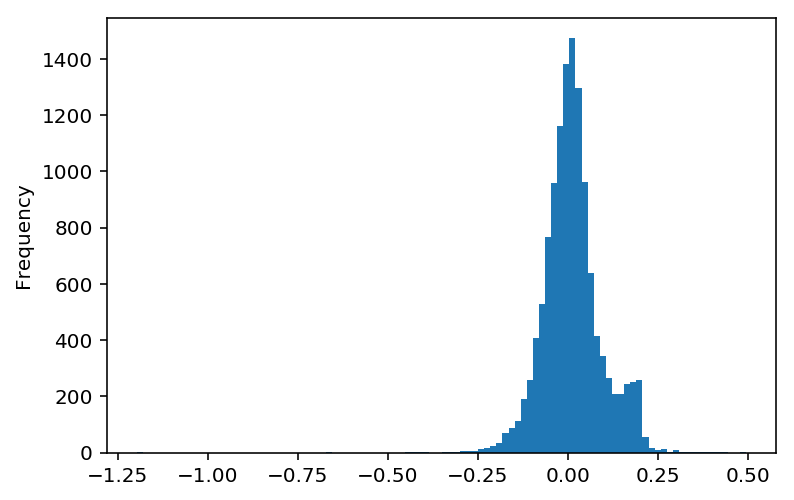

In [42]:
# taking signal returns from long_short_signal_returns_20 and plotting its histogram
# this distribution is similar to 20 days histogram distribution in section 6. Test for significance
long_short_signal_returns_20.signal_return.plot.hist(bins=100)

## Appendix 3
This section explains plot in section **6. Compute signal returns**

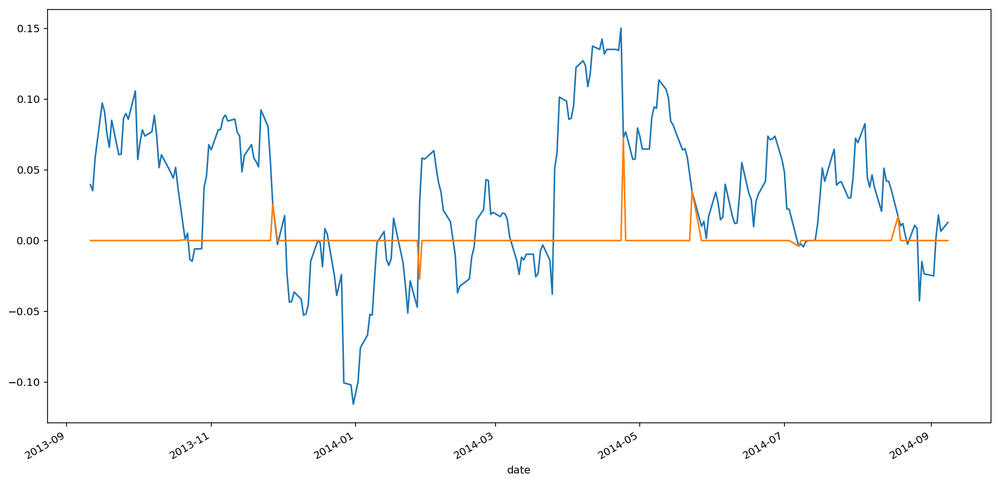

In [43]:
# giai thich ve graph ben duoi gom price_return_20 & signal_return_20
# price_return_20: la TAT CA cac return theo moi ngay voi price ahead 20
# signal_return_20: la return o tren nhung loc bot dua vao signal trading

price_return_20.AAPL[50:300].plot(figsize=(16,8))
signal_return_20.AAPL[50:300].plot()